# Possible scenarios for state growth under higher throughput regimes

#### Maria Silva, November 2025

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import brentq, fsolve

import warnings
warnings.filterwarnings("ignore")

In [2]:
# plotting theme
sns.set_theme(
    style="whitegrid", palette="Set2", rc={"figure.dpi": 500, "axes.titlesize": 15}
)

# output folder
current_path = os.getcwd()
repo_dir = os.path.abspath(os.path.join(current_path, ".."))
our_dir = os.path.join(repo_dir, "reports", "figures", "state_growth_scenarios_report")

## State growth scenarios

#### Data points

- As of May 2025, the current database size in a Geth node dedicated to state is ~340 GiB
- In May, the median size of new state created was ~205 MiB per day, which results in ~73 GiB of new state per year
- This was measured at a block limit of 36M gas and a target of 18M gas per block (50% utilization)
- On average, blocks use 30% of the gas for state creation

#### Block limit scenarios

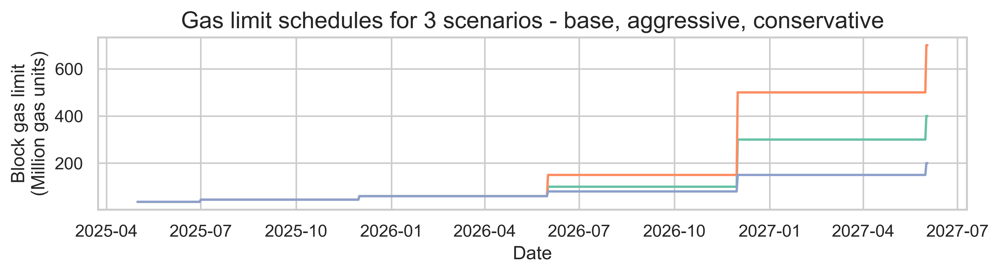

In [3]:
schedule_df = pd.DataFrame(columns=["day", "base_gas_limit"])
schedule_df["day"] = pd.date_range(start="2025-05-01", end="2027-06-02", freq="D")
schedule_df.loc[schedule_df["day"] == "2025-05-01", "base_gas_limit"] = 36
schedule_df.loc[schedule_df["day"] == "2025-05-01", "agg_gas_limit"] = 36
schedule_df.loc[schedule_df["day"] == "2025-05-01", "con_gas_limit"] = 36

schedule_df.loc[schedule_df["day"] == "2025-07-01", "base_gas_limit"] = 45
schedule_df.loc[schedule_df["day"] == "2025-07-01", "agg_gas_limit"] = 45
schedule_df.loc[schedule_df["day"] == "2025-07-01", "con_gas_limit"] = 45

schedule_df.loc[schedule_df["day"] == "2025-12-01", "base_gas_limit"] = 60
schedule_df.loc[schedule_df["day"] == "2025-12-01", "agg_gas_limit"] = 60
schedule_df.loc[schedule_df["day"] == "2025-12-01", "con_gas_limit"] = 60

schedule_df.loc[schedule_df["day"] == "2026-06-01", "base_gas_limit"] = 100
schedule_df.loc[schedule_df["day"] == "2026-06-01", "agg_gas_limit"] = 150
schedule_df.loc[schedule_df["day"] == "2026-06-01", "con_gas_limit"] = 80

schedule_df.loc[schedule_df["day"] == "2026-12-01", "base_gas_limit"] = 300
schedule_df.loc[schedule_df["day"] == "2026-12-01", "agg_gas_limit"] = 500
schedule_df.loc[schedule_df["day"] == "2026-12-01", "con_gas_limit"] = 150

schedule_df.loc[schedule_df["day"] == "2027-06-01", "base_gas_limit"] = 400
schedule_df.loc[schedule_df["day"] == "2027-06-01", "agg_gas_limit"] = 700
schedule_df.loc[schedule_df["day"] == "2027-06-01", "con_gas_limit"] = 200

schedule_df.fillna(method="ffill", inplace=True)


plt.figure(figsize=(10, 2))
sns.lineplot(
    data=schedule_df,
    x="day",
    y="base_gas_limit",
)
sns.lineplot(
    data=schedule_df,
    x="day",
    y="agg_gas_limit",
)
sns.lineplot(
    data=schedule_df,
    x="day",
    y="con_gas_limit",
)
plt.title("Gas limit schedules for 3 scenarios - base, aggressive, conservative")
plt.ylabel("Block gas limit\n(Million gas units)")
plt.xlabel("Date")
plt.show()

#### Expected state growth

In [4]:
growth_df = schedule_df.copy()
growth_df["base_new_state_mib"] = (205 * growth_df["base_gas_limit"]) / 36.0
growth_df["base_state_size_gib"] = (
    growth_df["base_new_state_mib"].cumsum() * 0.0009765625 + 340
)
growth_df["agg_new_state_mib"] = (205 * growth_df["agg_gas_limit"]) / 36.0
growth_df["agg_state_size_gib"] = (
    growth_df["agg_new_state_mib"].cumsum() * 0.0009765625 + 340
)
growth_df["con_new_state_mib"] = (205 * growth_df["con_gas_limit"]) / 36.0
growth_df["con_state_size_gib"] = (
    growth_df["con_new_state_mib"].cumsum() * 0.0009765625 + 340
)

growth_df[
    ["base_new_state_mib", "agg_new_state_mib", "con_new_state_mib"]
].drop_duplicates()

,base_new_state_mib,agg_new_state_mib,con_new_state_mib
0,205.000000,205.000000,205.000000
61,256.250000,256.250000,256.250000
214,341.666667,341.666667,341.666667
396,569.444444,854.166667,455.555556
579,1708.333333,2847.222222,854.166667
761,2277.777778,3986.111111,1138.888889


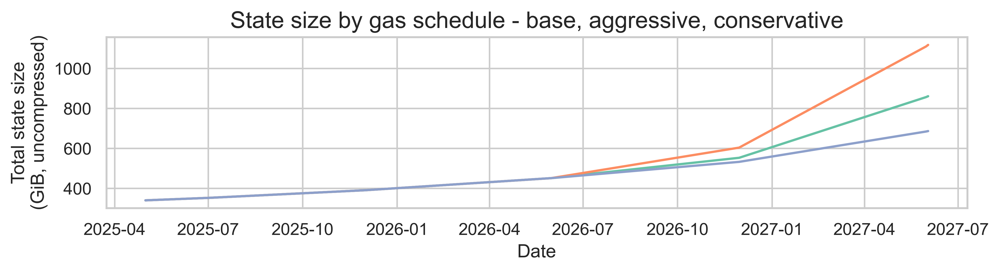

In [5]:
plt.figure(figsize=(10, 2))
sns.lineplot(
    data=growth_df,
    x="day",
    y="base_state_size_gib",
)
sns.lineplot(
    data=growth_df,
    x="day",
    y="agg_state_size_gib",
)
sns.lineplot(
    data=growth_df,
    x="day",
    y="con_state_size_gib",
)
plt.title("State size by gas schedule - base, aggressive, conservative")
plt.ylabel("Total state size\n(GiB, uncompressed)")
plt.xlabel("Date")
plt.show()

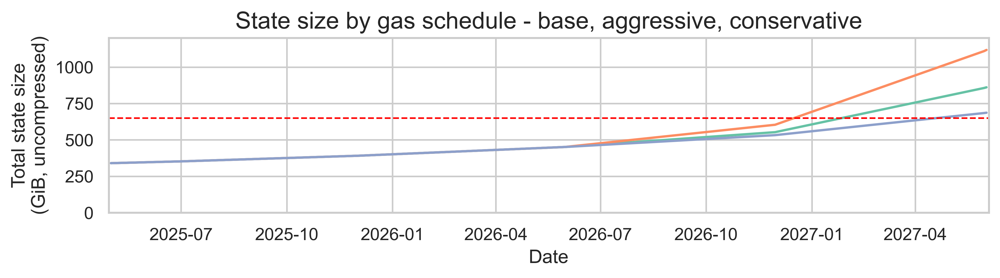

In [6]:
plt.figure(figsize=(10, 2))
sns.lineplot(
    data=growth_df,
    x="day",
    y="base_state_size_gib",
)
sns.lineplot(
    data=growth_df,
    x="day",
    y="agg_state_size_gib",
)
sns.lineplot(
    data=growth_df,
    x="day",
    y="con_state_size_gib",
)
plt.axhline(y=650, color="red", linestyle="--", linewidth=1)
plt.ylim(0, 1200)
plt.xlim(
    growth_df["day"].min() - pd.Timedelta(days=2),
    growth_df["day"].max() + pd.Timedelta(days=2),
)
plt.title("State size by gas schedule - base, aggressive, conservative")
plt.ylabel("Total state size\n(GiB, uncompressed)")
plt.xlabel("Date")
plt.show()

In [7]:
growth_df[growth_df["day"] == "2026-06-01"][
    ["base_state_size_gib", "agg_state_size_gib", "con_state_size_gib"]
].round()

,base_state_size_gib,agg_state_size_gib,con_state_size_gib
396,452.0,452.0,452.0


In [8]:
growth_df[growth_df["day"] == "2026-12-01"][
    ["base_state_size_gib", "agg_state_size_gib", "con_state_size_gib"]
].round()

,base_state_size_gib,agg_state_size_gib,con_state_size_gib
579,555.0,607.0,533.0


In [9]:
growth_df[growth_df["day"] == "2027-06-01"][
    ["base_state_size_gib", "agg_state_size_gib", "con_state_size_gib"]
].round()

,base_state_size_gib,agg_state_size_gib,con_state_size_gib
761,859.0,1114.0,686.0


## Modeling impact of repricing

In this section, we define a simple model that allow us to estimate the average state growth per day and how much gas is available in a block for burst operations (compute, state access and data).

#### Model inputs

- $G$: The block gas limit.
- $b$: The equilibrium base fee $b$ in gwei.
- $g_\text{state}$: The gas cost per new byte added to the state byte.
- $g_\text{burst}$: The gas costs for each second of burst resource usage.
- $S(p)$: The demand curve for state creation, measured as the total number of net state bytes willing to be added in a block at the price $p$. Note that $p$ is cost in gwei of adding one byte to state and is computed as $p=b\cdot g_\text{state}$.
- $B(p)$: The demand curve burst resource usage, measured as the number of slot time in seconds willing to be added in a block at the price $p$. In this case, $p=b\cdot g_\text{burst}$.


#### Model assumptions

- The base fee follows the EIP-1559 design, where block usage above 50% of $G$ leads to an increase in the base fee for the next block, wile a block usage below 50% of $G$ leads to a decrease in the base fee for the next block.
- With current pricing, blocks occupy on average 50% of $G$, with 30% of that gas allocated to state creation and the remaining to burst resources.
- The average block is achieved at equilibrium, when 50% of $G$ is sufficient to cover the demand for state creation and burst resource usage at the price $p$.
- Both demand curves are modelled with an isoelastic model (scale-free, works cleanly under rescaling):

$$
S(p)=A_s\,p^{-\varepsilon_s},\qquad 
B(p)=A_b\,p^{-\varepsilon_b},\qquad 
\varepsilon_s,\varepsilon_b>0
$$.

#### Scenario

- Gas limit increases by a factor of $n$, i.e.,  $G = n \, G^0$
- State gas costs increases by a factor of $m$, i.e., $g_\text{state} = m \, g_\text{state}^0$

We expect the base fee to decrease until reaching a new equilibrium where both more state and more burst resources are used.

#### Base derivation

Let the per-block equilibrium usage at price $p$ be
- State bytes: $S(p)=S(b g_\text{state})$
- Burst seconds: $B(p)=B(b g_\text{burst})$

The gas used in a block at base fee b is defined as:

$$
U(b)=g_\text{state}\,S(b\,g_\text{state})\;+\;g_\text{burst}\,B(b\,g_\text{burst})
$$

For the scenario, EIP-1559 drives $b$ toward the value $b^*$ such that:

$$
U(b^*)=0.5\, n\, G_\text{limit}^0
$$

At this new equilibrium, we get the following per-block usage:

- $S^* = S(b^* \, m\, g_\text{state}^0)$, which leads to an average state growth of $2,628,000\cdot S^*$ bytes per year
- $B^* = B(b^* g_\text{burst}^0)$

and the following shares per resource type:

- $\text{Share}_\text{state}=\frac{m\,g_\text{state}^0S^*}{0.5\, n\, G_\text{limit}^0}$
- $\text{Share}_\text{burst}=1-\text{Share}_\text{state}$


#### Calibration

With current $G=G^0$, equilibrium $b=b^0$ and initial gas prices $g_\text{state}^0$ and $g_\text{burst}^0$, we get:

- $g_\text{state}^0 S(b^0 g_\text{state}^0)= 0.3 \cdot 0.5 \cdot G^0 = 0.15\, G^0$
- $g_\text{burst}^0 B(b^0 g_\text{burst}^0)= 0.7 \cdot 0.5 \cdot G^0 = 0.35\, G^0$

With this, we can calibrate $A_s$ and $A_b$ as:

- $A_s = S(p)p^{\varepsilon_s} = \frac{0.15\,G^0}{g_\text{state}^0}\,(b^0g_\text{state}^0)^{\varepsilon_s}$
  
- $A_b = B(p)p^{\varepsilon_b} = \frac{0.35\,G^0}{g_\text{burst}^0}\,(b^0g_\text{burst}^0)^{\varepsilon_b}$

Under this choice, for any $b$ we get the following formula for gas used in the block under equilibrium:

$$
U(b)=
0.15\,G^0 \Big(\frac{g_\text{state}}{g_\text{state}^0}\Big)^{1-\varepsilon_s} \Big(\frac{b}{b^0}\Big)^{-\varepsilon_s}
\;+\;
0.35\,G^0 \Big(\frac{g_\text{burst}}{g_\text{burst}^0}\Big)^{1-\varepsilon_b} \Big(\frac{b}{b^0}\Big)^{-\varepsilon_b}
$$

We can also estimate $g_\text{burst}^0$ from gas limit and the current state growth rate. Here we are taking an average cost assuming a 50% gas limit utilization:

$$
g_\text{state}^0 \, S^0 = 0.15\, G_0 \implies g_\text{state}^0 = \frac{0.15\, G^0}{S^0}
$$

For the burst resources, we will price based on the worse case block, i.e., assume that if the block was full of burst resource operations until the block limit, it would take 2 seconds to execute:

$$
g_\text{burst}^0 \, 2  = G^0 \implies g_\text{burst}^0 = \frac{G^0}{2}
$$

From this, we can directly derive the base throughput for burst resources:

$$
g_\text{burst}^0 \, B^0 = 0.35\,G^0 \implies \frac{G^0}{2} \, B^0 = 0.35\,G^0 \implies B^0 = 0.7 \, \, \text{seconds}
$$

### Scenario derivation

In the scenario, $G=n\,G^0$, $g_\text{state}=m\,g_\text{state}^0$ and $g_\text{burst}=g_\text{burst}^0$, which makes the total gas used in the block under equilibrium be:

$$
U(b)=
0.15\,G^0\, m^{1-\varepsilon_s} \Big(\frac{b}{b^0}\Big)^{-\varepsilon_s}
\;+\;
0.35\,G^0 \Big(\frac{b}{b^0}\Big)^{-\varepsilon_b}
$$

Also, at equilibrium, we are using 50% of the new gas limit so:

$$
U(b)= 0.5\cdot n\cdot G^0 \iff
$$

$$
0.15\,G^0\, m^{1-\varepsilon_s} \Big(\frac{b}{b^0}\Big)^{-\varepsilon_s}\;+\; 0.35\,G^0 \Big(\frac{b}{b^0}\Big)^{-\varepsilon_b} = G^0 \iff
$$

$$
0.15\, m^{1-\varepsilon_s} \Big(\frac{b}{b^0}\Big)^{-\varepsilon_s}\;+\; 0.35 \Big(\frac{b}{b^0}\Big)^{-\varepsilon_b} = 1
$$

We can compute the roots of this polynomial to find the equilibrium base fee $b^*$. If the polynomial has a root $r \in \mathopen] 0,1\mathclose[$, then $b^* = b^0 \, r$. From this, we can compute the per-block usages and gas shares as defined in the base derivation.

The following functions implement this logic:

In [10]:
def equilibrium_equation(r, m, eps_s, eps_b):
    """
    Equilibrium condition: 0.15*m^(1-eps_s)*r^(-eps_s) + 0.35*r^(-eps_b) = 1
    """
    return 0.15 * (m ** (1 - eps_s)) * (r ** (-eps_s)) + 0.35 * (r ** (-eps_b)) - 1

def find_equilibrium_base_fee(m, eps_s, eps_b, b_0):
    """
    Find equilibrium base fee b* given scenario parameters using 
    Brent's method on interval [0.005, 1.0]
    """
    def eq(r):
        return equilibrium_equation(r, m, eps_s, eps_b)
    # Check that function has opposite signs at endpoints
    f_low = eq(0.005)
    f_high = eq(1.0)
    
    if f_low * f_high < 0:  # opposite signs = root exists
        r_star = brentq(eq, 0.005, 1.0, xtol=1e-8)
        return b_0 * r_star
    else:
        print(f"Warning: No valid root found for m={m}, eps_s={eps_s}, eps_b={eps_b}")
        return 0.0

In [11]:
def compute_equilibrium_stats(b_star, m, n, eps_s, eps_b, G_0, b_0, S_0):
    """
    Compute equilibrium per-block usage and resource shares
    """
    # Compute initial gas prices
    g_state_0 = 0.15 * G_0 / S_0
    g_burst_0 = G_0 / 2

    # Compute base fee multiplier
    r_star = b_star / b_0
    if r_star == 0:
        return {
            "b_star": b_star,
            "r_star": r_star,
            "A_s": None,
            "A_b": None,
            "S_star": None,
            "B_star": None,
            "gas_used_state": None,
            "gas_used_burst": None,
            "gas_used_total": None,
            "share_state": None,
            "share_burst": None,
            "state_growth_per_year": None,
        }
    else:
        # Calibrate demand amplitudes from initial conditions
        # A_s = (0.15 * G_0 / g_state_0) * (b_0 * g_state_0)^eps_s
        A_s = (0.15 * G_0 / g_state_0) * (b_0 * g_state_0) ** eps_s

        # A_b = (0.35 * G_0 / g_burst_0) * (b_0 * g_burst_0)^eps_b
        A_b = (0.35 * G_0 / g_burst_0) * (b_0 * g_burst_0) ** eps_b

        # Compute equilibrium state demand: S(p) = A_s * p^(-eps_s)
        # where p = b_star * m * g_state_0
        p_state = b_star * m * g_state_0
        S_star = A_s * (p_state ** (-eps_s))

        # Compute equilibrium burst demand: B(p) = A_b * p^(-eps_b)
        # where p = b_star * g_burst_0
        p_burst = b_star * g_burst_0
        B_star = A_b * (p_burst ** (-eps_b))

        # Compute gas usage per resource type
        gas_used_state = m * g_state_0 * S_star
        gas_used_burst = g_burst_0 * B_star
        gas_used_total = gas_used_state + gas_used_burst

        # Compute resource shares
        share_state = gas_used_state / (0.5 * n * G_0)
        share_burst = gas_used_burst / (0.5 * n * G_0)

        # Compute annual state growth
        # 2,628,000 blocks per year 
        annual_state_growth_gib = 2_628_000 * S_star * 9.313225746154785 / 1e10

        return {
            "b_star": b_star,
            "r_star": r_star,
            "A_s": A_s,
            "A_b": A_b,
            "S_star": S_star,
            "burst_throughput_s": B_star,
            "gas_used_state": gas_used_state,
            "gas_used_burst": gas_used_burst,
            "gas_used_total": gas_used_total,
            "share_state": share_state,
            "share_burst": share_burst,
            "annual_state_growth_gib": annual_state_growth_gib,
        }

## Repricing impact for double gas limit & same prices

#### Parameters

- $n=2$
- $m=1$
- $G^0=36$ (in million gas units)
- $b^0=1$ (in gwei)
- State growth is 205 MiB per day $\implies$ $S^0 = \frac{205 \cdot 1048576 \cdot 12}{60 \cdot 60 \cdot 24}$ bytes
- $\varepsilon_s,\varepsilon_b  \in [0.1, 1.5]$



In [12]:
n=2
m=1
G_0=36
b_0=1.0
S_0 = (205 * 1048576 * 12)/(60 * 60 * 24)
results_list = []

for eps_s in np.linspace(0.1, 1.5, 10):
    for eps_b in np.linspace(0.1, 1.5, 10):
        # Find equilibrium
        b_star = find_equilibrium_base_fee(m, eps_s, eps_b, b_0)
        # Compute usage and shares
        results = compute_equilibrium_stats(b_star, m, n, eps_s, eps_b, G_0, b_0, S_0)
        results["eps_s"] = eps_s.round(2).astype(str)
        results["eps_b"] = eps_b.round(2).astype(str)
        results_list.append(results)

base_scenario_df = pd.DataFrame(results_list)

### Results

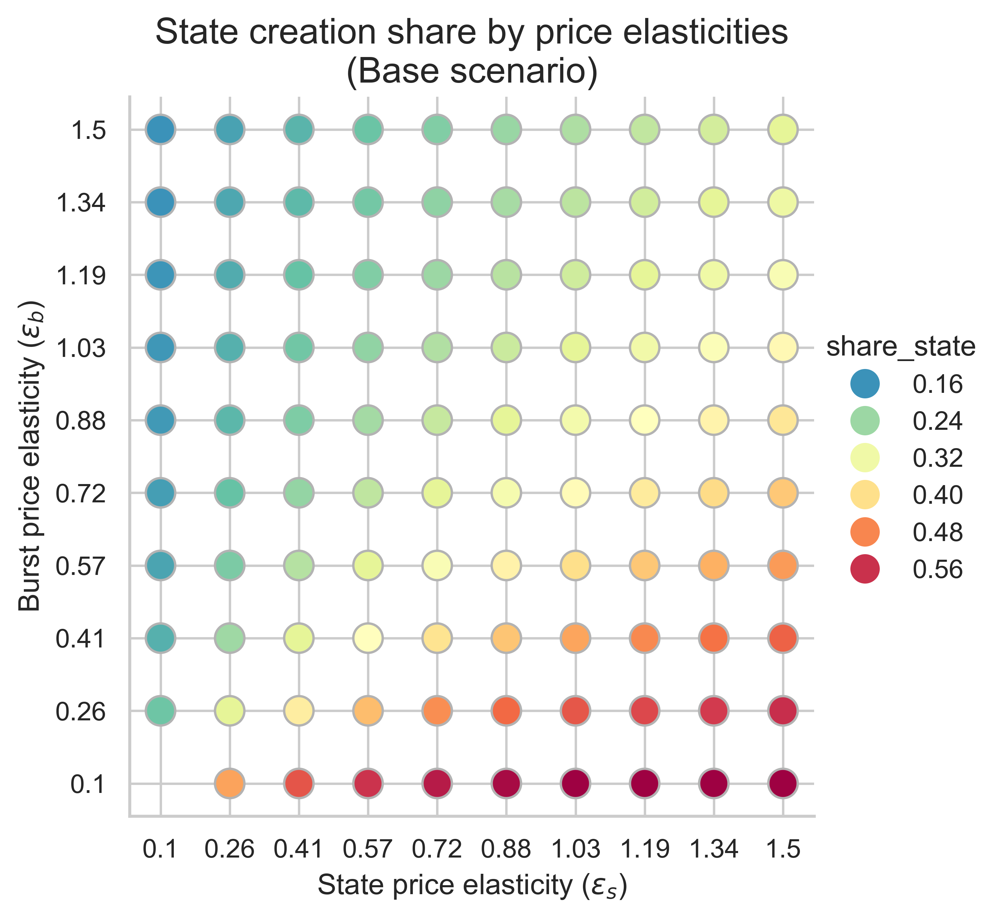

In [13]:
g = sns.relplot(
    data=base_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="share_state",
    palette="Spectral_r",
    hue_norm=(0.1, 0.6),
    edgecolor=".7",
    s=150,
)
g.set(
    title="State creation share by price elasticities\n(Base scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "share_state_m1.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

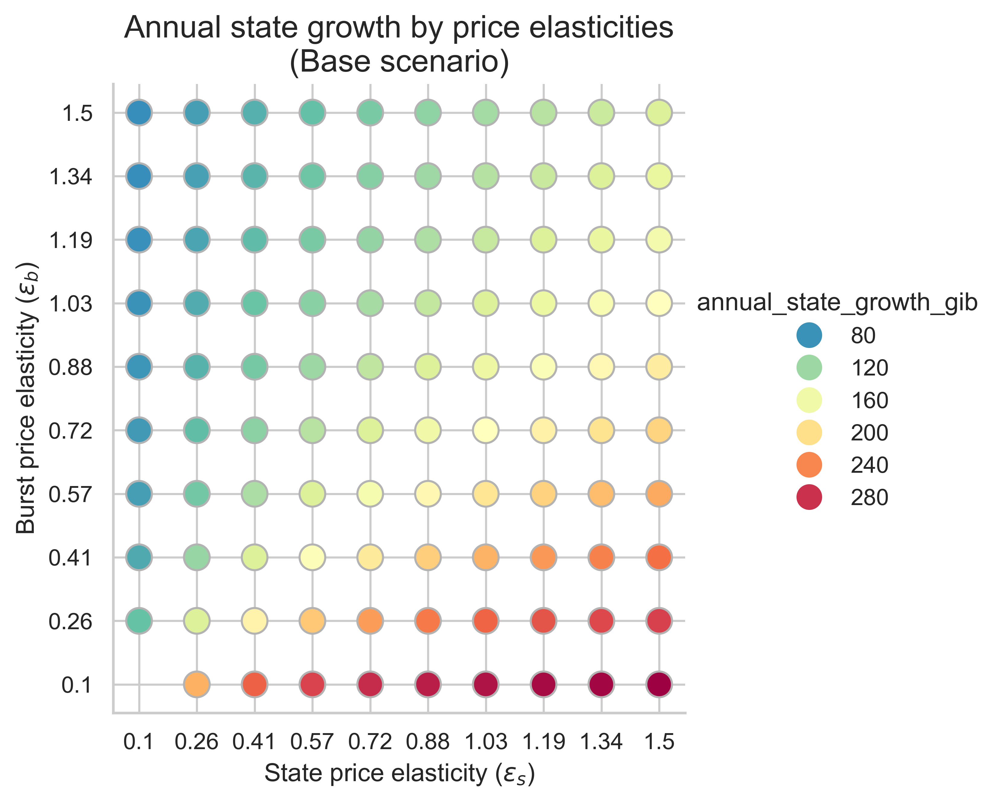

In [14]:
g = sns.relplot(
    data=base_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="annual_state_growth_gib",
    palette="Spectral_r",
    hue_norm=(50, 300),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Annual state growth by price elasticities\n(Base scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "state_growth_m1.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

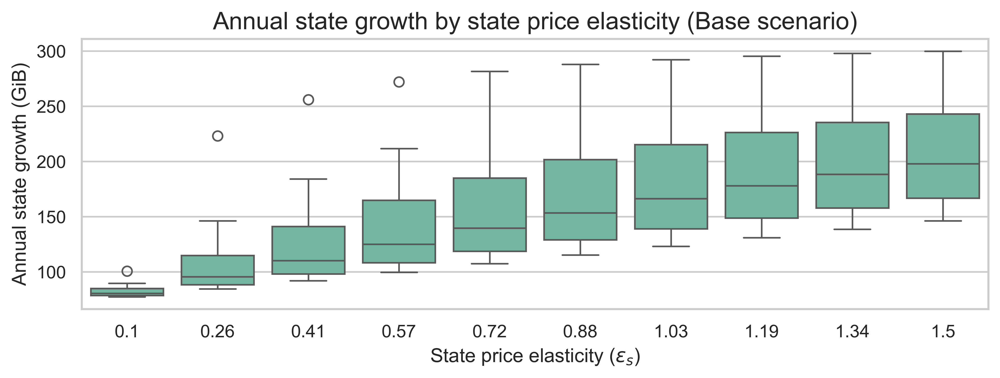

In [15]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=base_scenario_df,
    x="eps_s",
    y="annual_state_growth_gib"
)

plt.title("Annual state growth by state price elasticity (Base scenario)")
plt.ylabel("Annual state growth (GiB)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
plt.show()

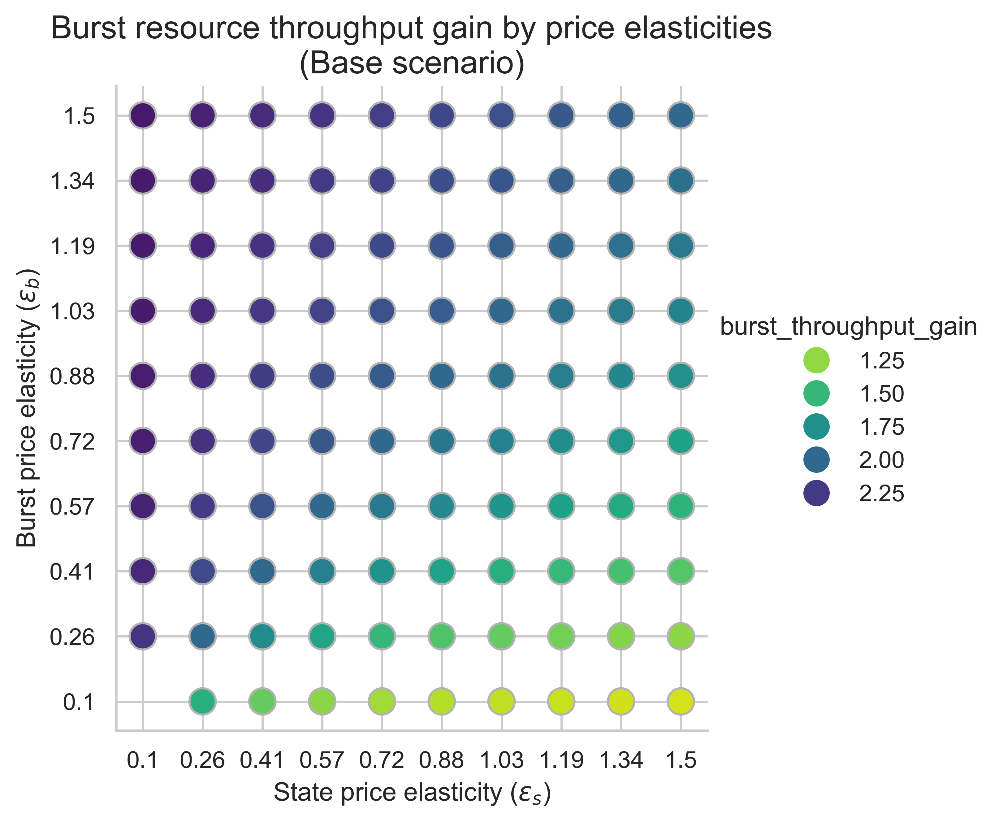

In [16]:
base_scenario_df["burst_throughput_gain"] = base_scenario_df["burst_throughput_s"]/0.7
g = sns.relplot(
    data=base_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="burst_throughput_gain",
    palette="viridis_r",
    hue_norm=(1, 2.5),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Burst resource throughput gain by price elasticities\n(Base scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "burst_throughput_m1.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

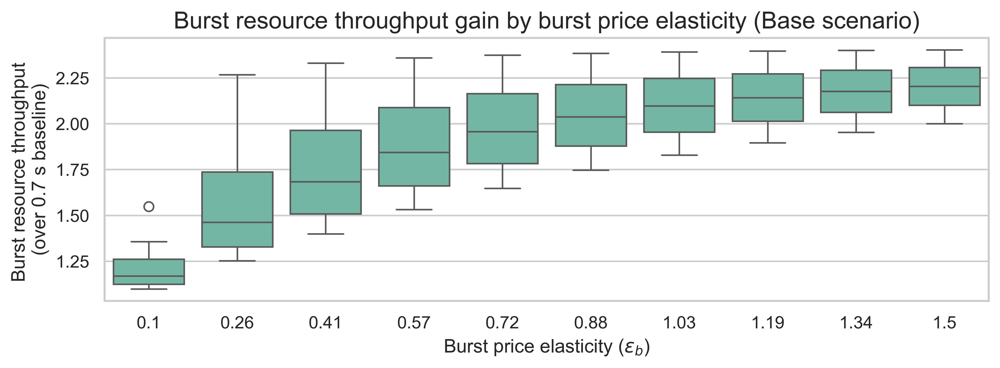

In [17]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=base_scenario_df,
    x="eps_b",
    y="burst_throughput_gain"
)

plt.title("Burst resource throughput gain by burst price elasticity (Base scenario)")
plt.ylabel("Burst resource throughput \n(over 0.7 s baseline)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
plt.show()

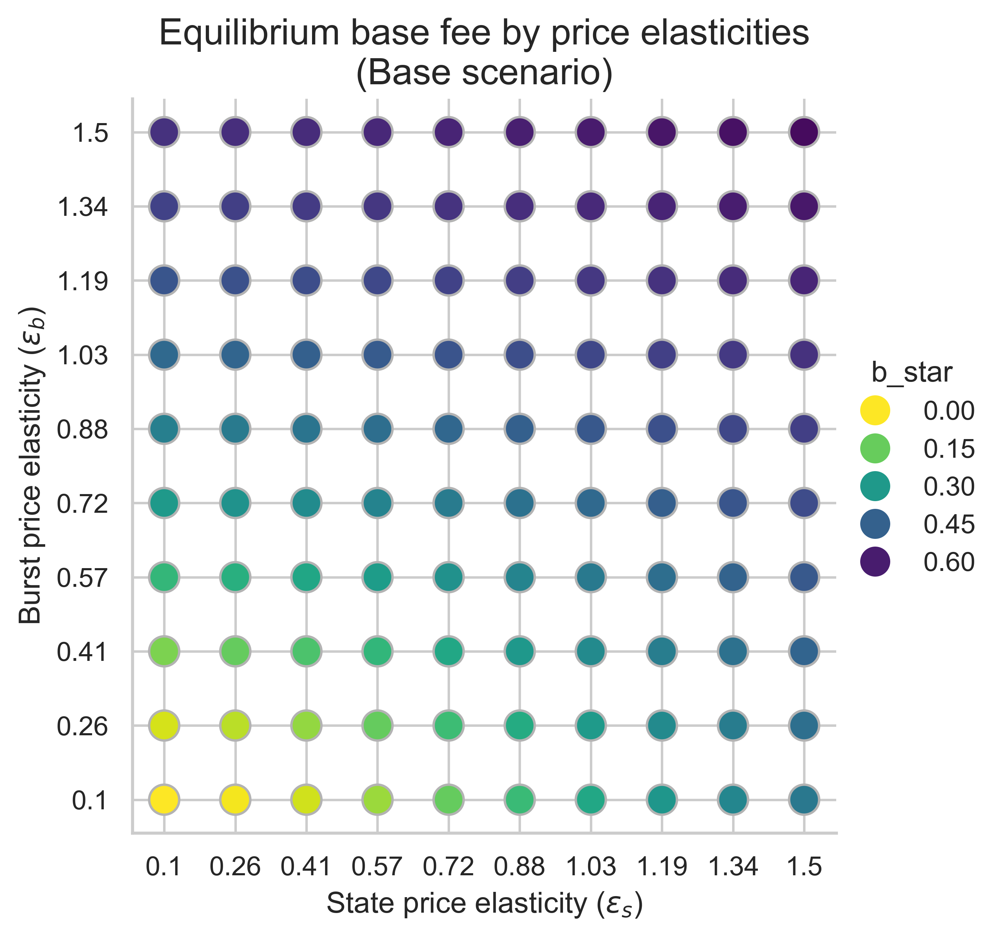

In [18]:
g = sns.relplot(
    data=base_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="b_star",
    palette="viridis_r",
    hue_norm=(0, 0.65),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Equilibrium base fee by price elasticities\n(Base scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
plt.show()

## Repricing impact for double gas limit & double state price

#### Parameters

- $n=2$
- $m=2$
- $G^0=36$ (in million gas units)
- $b^0=1$ (in gwei)
- State growth is 205 MiB per day $\implies$ $S^0 = \frac{205 \cdot 1048576 \cdot 12}{60 \cdot 60 \cdot 24}$ bytes
- $\varepsilon_s,\varepsilon_b  \in [0.1, 1.5]$



In [19]:
n=2
m=2
G_0=36
b_0=1.0
S_0 = (205 * 1048576 * 12)/(60 * 60 * 24)
results_list = []

for eps_s in np.linspace(0.1, 1.5, 10):
    for eps_b in np.linspace(0.1, 1.5, 10):
        # Find equilibrium
        b_star = find_equilibrium_base_fee(m, eps_s, eps_b, b_0)
        # Compute usage and shares
        results = compute_equilibrium_stats(b_star, m, n, eps_s, eps_b, G_0, b_0, S_0)
        results["eps_s"] = eps_s.round(2).astype(str)
        results["eps_b"] = eps_b.round(2).astype(str)
        results_list.append(results)

double_scenario_df = pd.DataFrame(results_list)

### Results

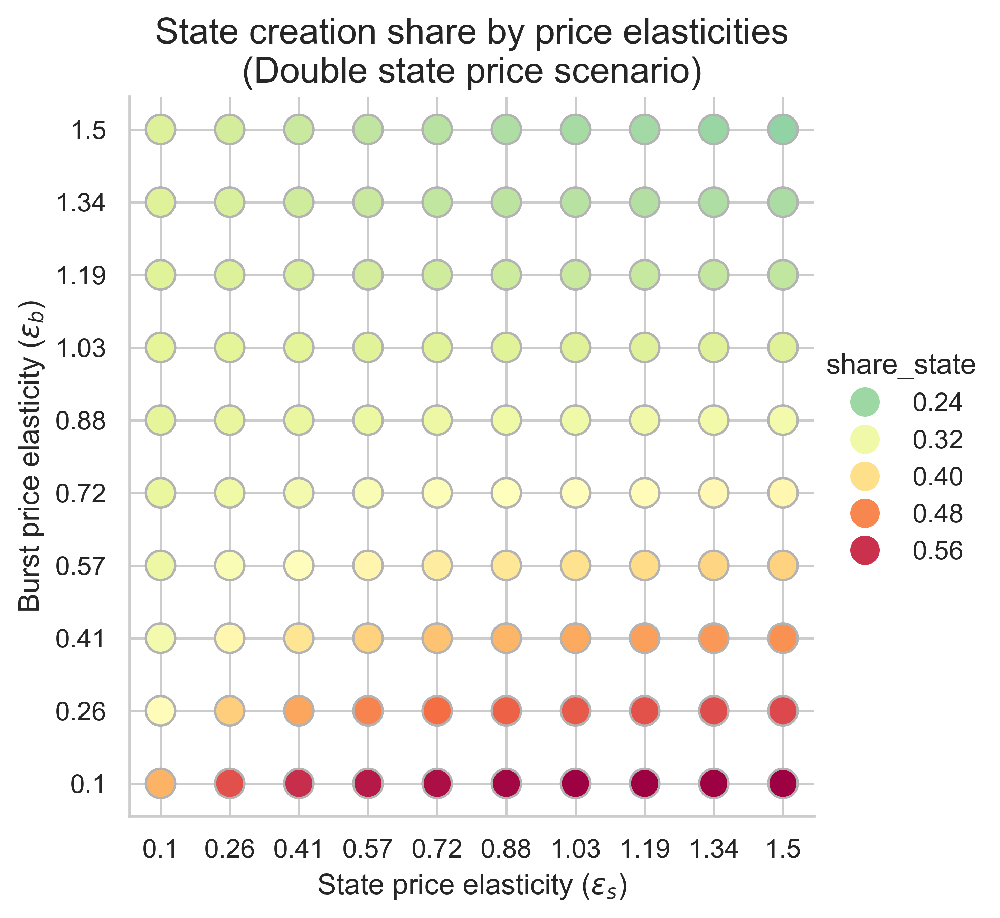

In [20]:
g = sns.relplot(
    data=double_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="share_state",
    palette="Spectral_r",
    hue_norm=(0.1, 0.6),
    edgecolor=".7",
    s=150,
)
g.set(
    title="State creation share by price elasticities\n(Double state price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "share_state_m2.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

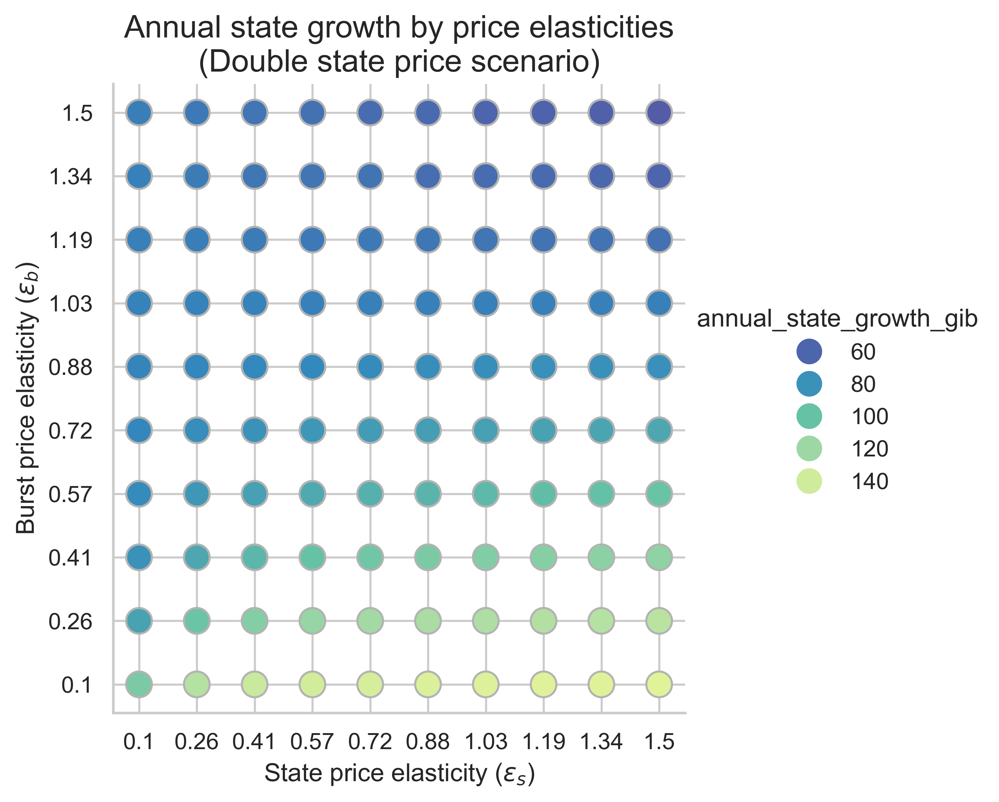

In [21]:
g = sns.relplot(
    data=double_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="annual_state_growth_gib",
    palette="Spectral_r",
    hue_norm=(50, 300),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Annual state growth by price elasticities\n(Double state price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "state_growth_m2.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

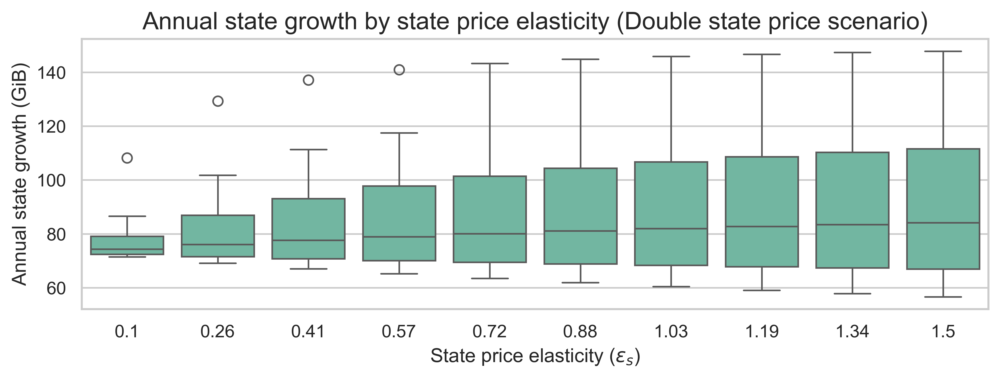

In [22]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=double_scenario_df,
    x="eps_s",
    y="annual_state_growth_gib"
)

plt.title("Annual state growth by state price elasticity (Double state price scenario)")
plt.ylabel("Annual state growth (GiB)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
plt.show()

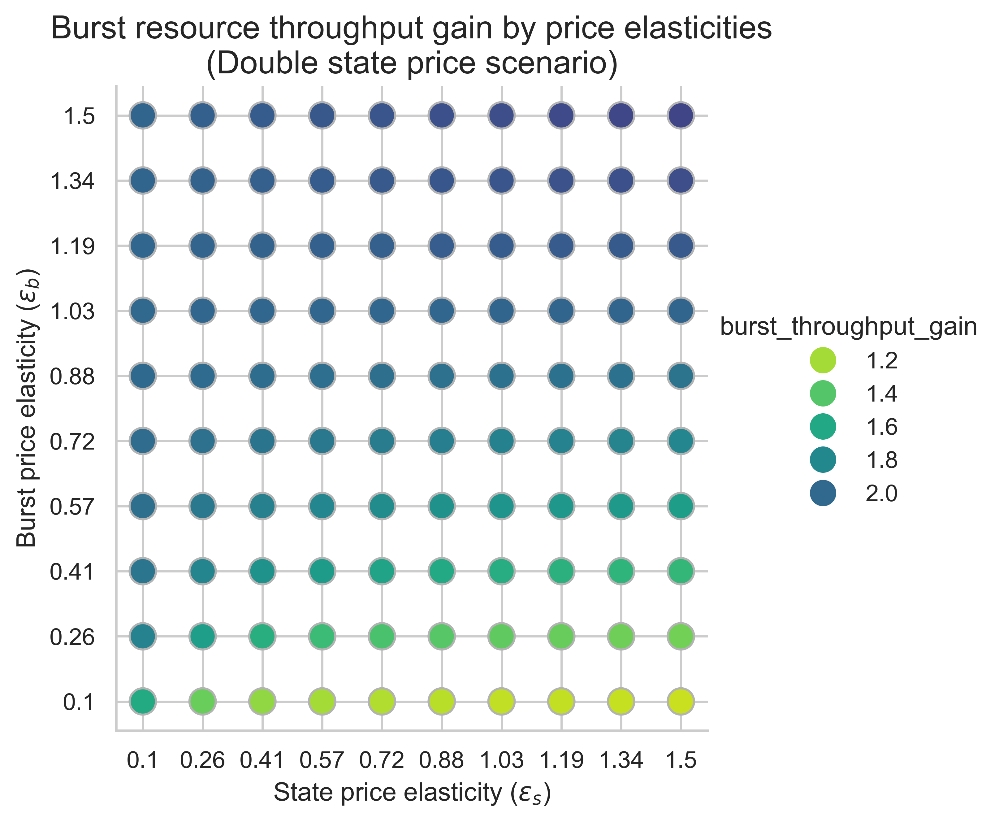

In [23]:
double_scenario_df["burst_throughput_gain"] = double_scenario_df["burst_throughput_s"]/0.7
g = sns.relplot(
    data=double_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="burst_throughput_gain",
    palette="viridis_r",
    edgecolor=".7",
    s=150,
    hue_norm=(1, 2.5),
)
g.set(
    title="Burst resource throughput gain by price elasticities\n(Double state price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "burst_throughput_m2.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

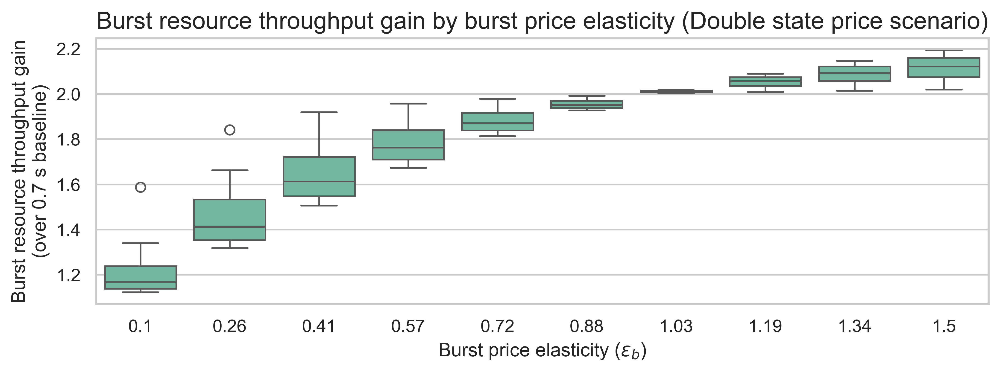

In [24]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=double_scenario_df,
    x="eps_b",
    y="burst_throughput_gain"
)

plt.title("Burst resource throughput gain by burst price elasticity (Double state price scenario)")
plt.ylabel("Burst resource throughput gain\n(over 0.7 s baseline)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
plt.show()

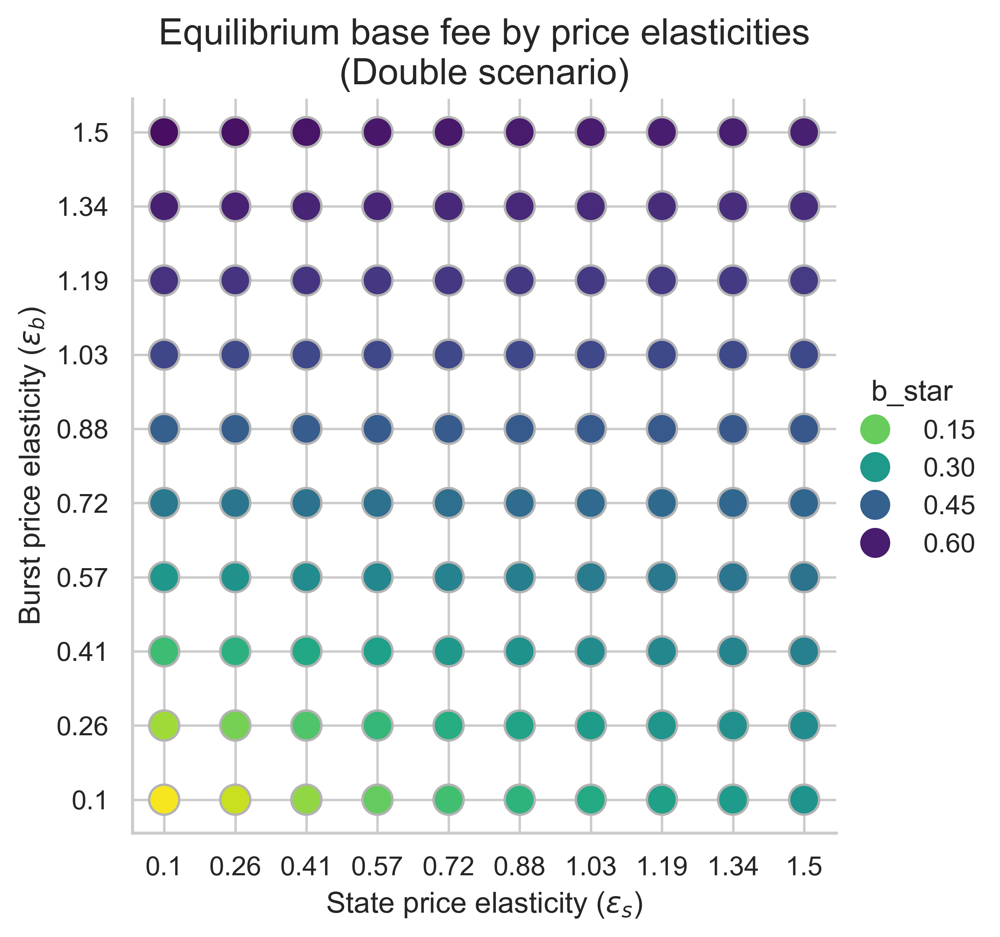

In [25]:
g = sns.relplot(
    data=double_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="b_star",
    palette="viridis_r",
    hue_norm=(0, 0.65),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Equilibrium base fee by price elasticities\n(Double scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
plt.show()

## Repricing impact for double gas limit & triple state price

#### Parameters

- $n=2$
- $m=3$
- $G^0=36$ (in million gas units)
- $b^0=1$ (in gwei)
- State growth is 205 MiB per day $\implies$ $S^0 = \frac{205 \cdot 1048576 \cdot 12}{60 \cdot 60 \cdot 24}$ bytes
- $\varepsilon_s,\varepsilon_b  \in [0.1, 1.5]$



In [26]:
n=2
m=3
G_0=36
b_0=1.0
S_0 = (205 * 1048576 * 12)/(60 * 60 * 24)
results_list = []

for eps_s in np.linspace(0.1, 1.5, 10):
    for eps_b in np.linspace(0.1, 1.5, 10):
        # Find equilibrium
        b_star = find_equilibrium_base_fee(m, eps_s, eps_b, b_0)
        # Compute usage and shares
        results = compute_equilibrium_stats(b_star, m, n, eps_s, eps_b, G_0, b_0, S_0)
        results["eps_s"] = eps_s.round(2).astype(str)
        results["eps_b"] = eps_b.round(2).astype(str)
        results_list.append(results)

triple_scenario_df = pd.DataFrame(results_list)

### Results

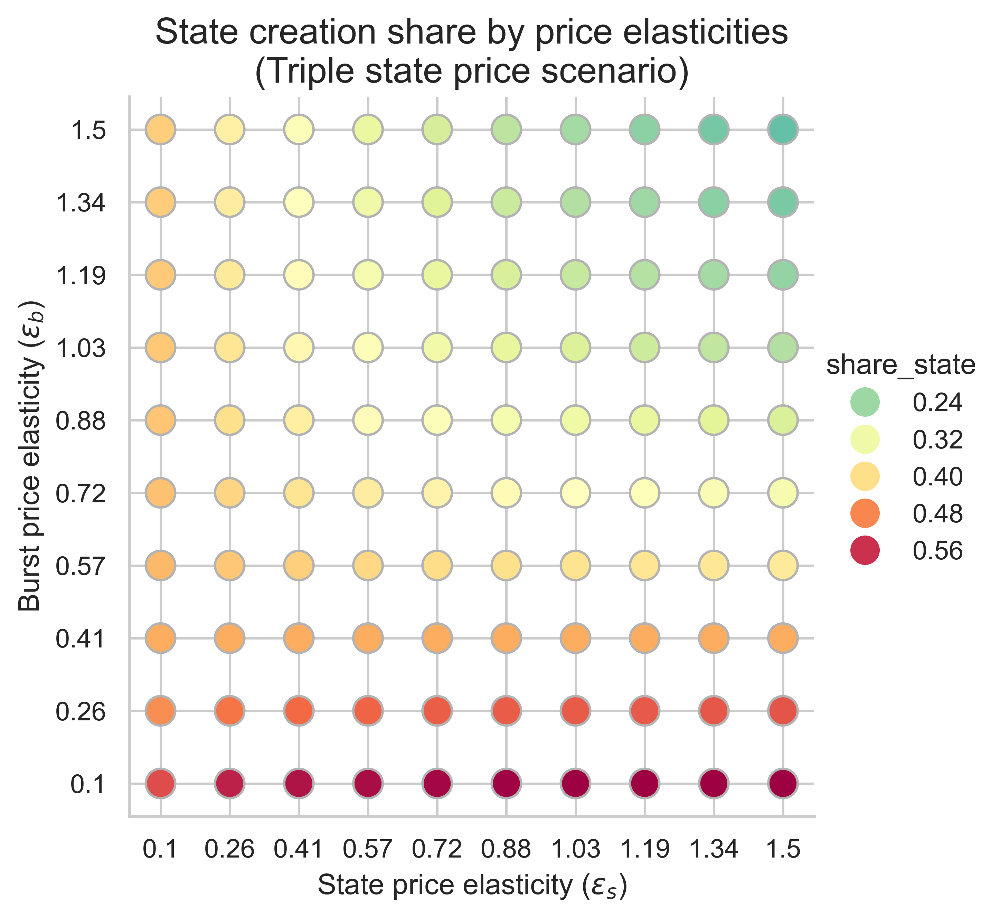

In [27]:
g = sns.relplot(
    data=triple_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="share_state",
    palette="Spectral_r",
    hue_norm=(0.1, 0.6),
    edgecolor=".7",
    s=150,
)
g.set(
    title="State creation share by price elasticities\n(Triple state price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "share_state_m3.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

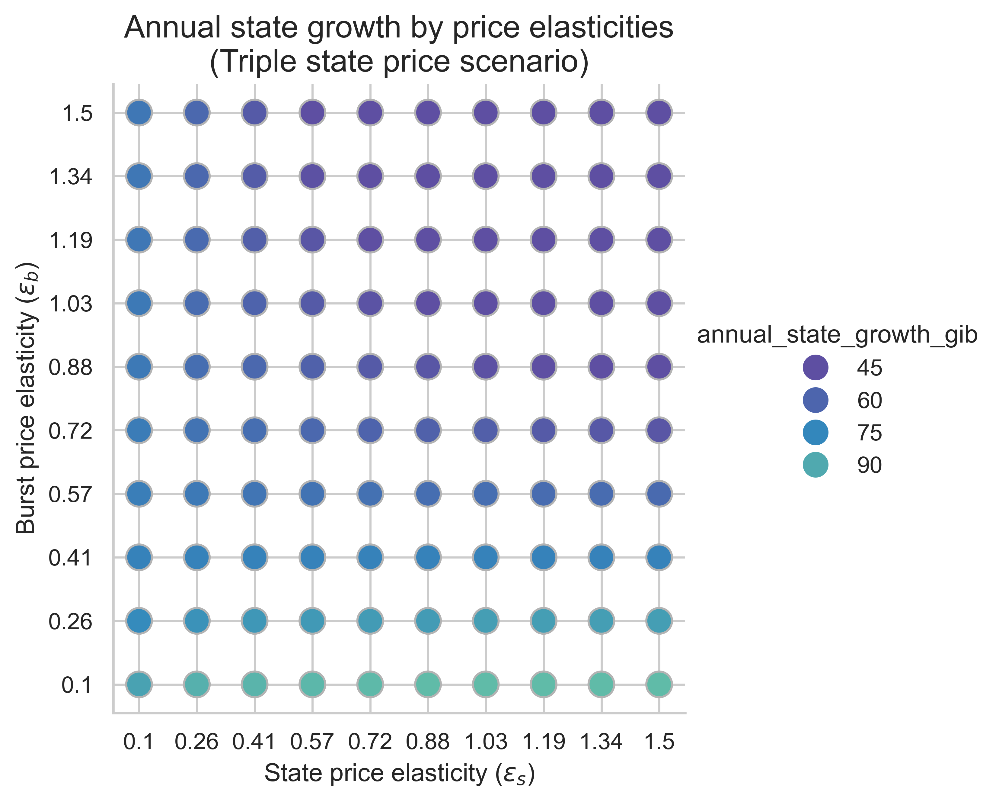

In [28]:
g = sns.relplot(
    data=triple_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="annual_state_growth_gib",
    palette="Spectral_r",
    hue_norm=(50, 300),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Annual state growth by price elasticities\n(Triple state price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "state_growth_m3.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

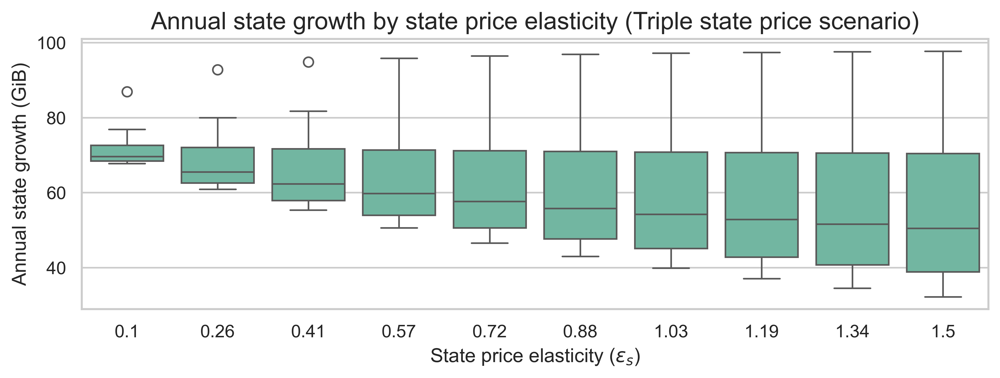

In [29]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=triple_scenario_df,
    x="eps_s",
    y="annual_state_growth_gib"
)

plt.title("Annual state growth by state price elasticity (Triple state price scenario)")
plt.ylabel("Annual state growth (GiB)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
plt.show()

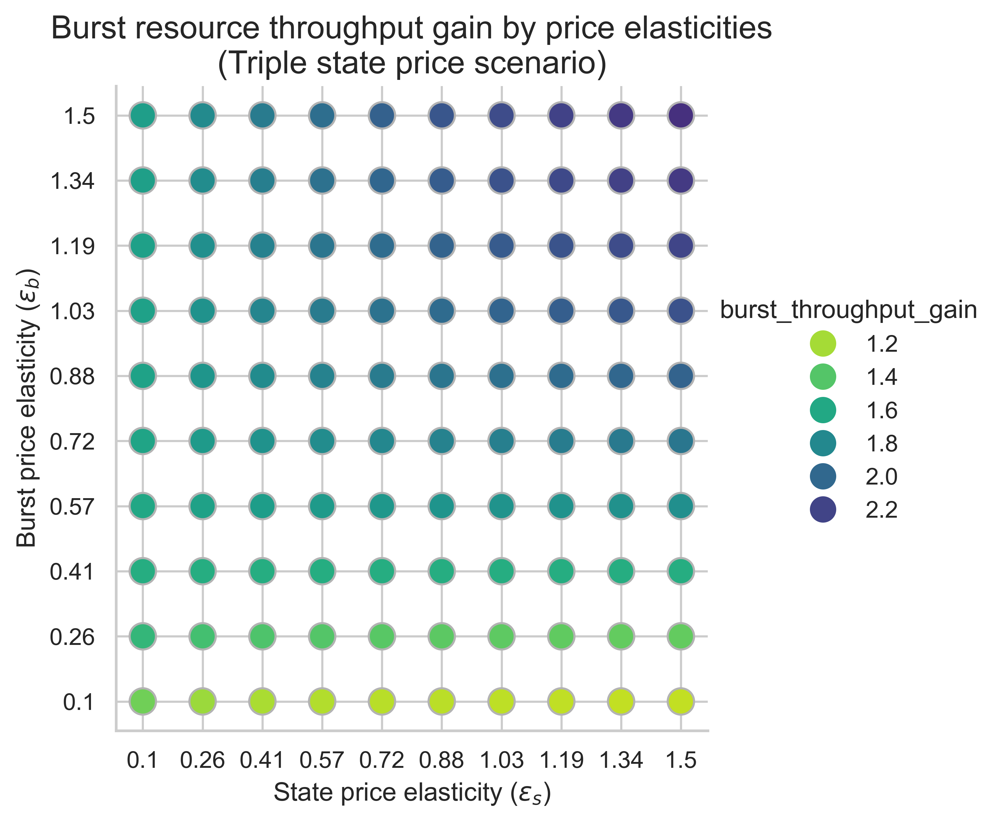

In [30]:
triple_scenario_df["burst_throughput_gain"] = triple_scenario_df["burst_throughput_s"]/0.7
g = sns.relplot(
    data=triple_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="burst_throughput_gain",
    palette="viridis_r",
    edgecolor=".7",
    s=150,
    hue_norm=(1, 2.5),
)
g.set(
    title="Burst resource throughput gain by price elasticities\n(Triple state price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
our_file = os.path.join(our_dir, "burst_throughput_m3.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

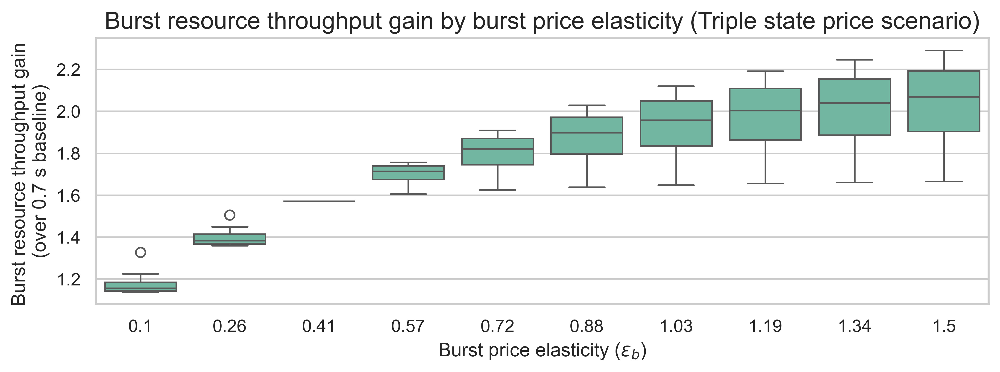

In [31]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=triple_scenario_df,
    x="eps_b",
    y="burst_throughput_gain"
)

plt.title("Burst resource throughput gain by burst price elasticity (Triple state price scenario)")
plt.ylabel("Burst resource throughput gain \n(over 0.7 s baseline)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
plt.show()

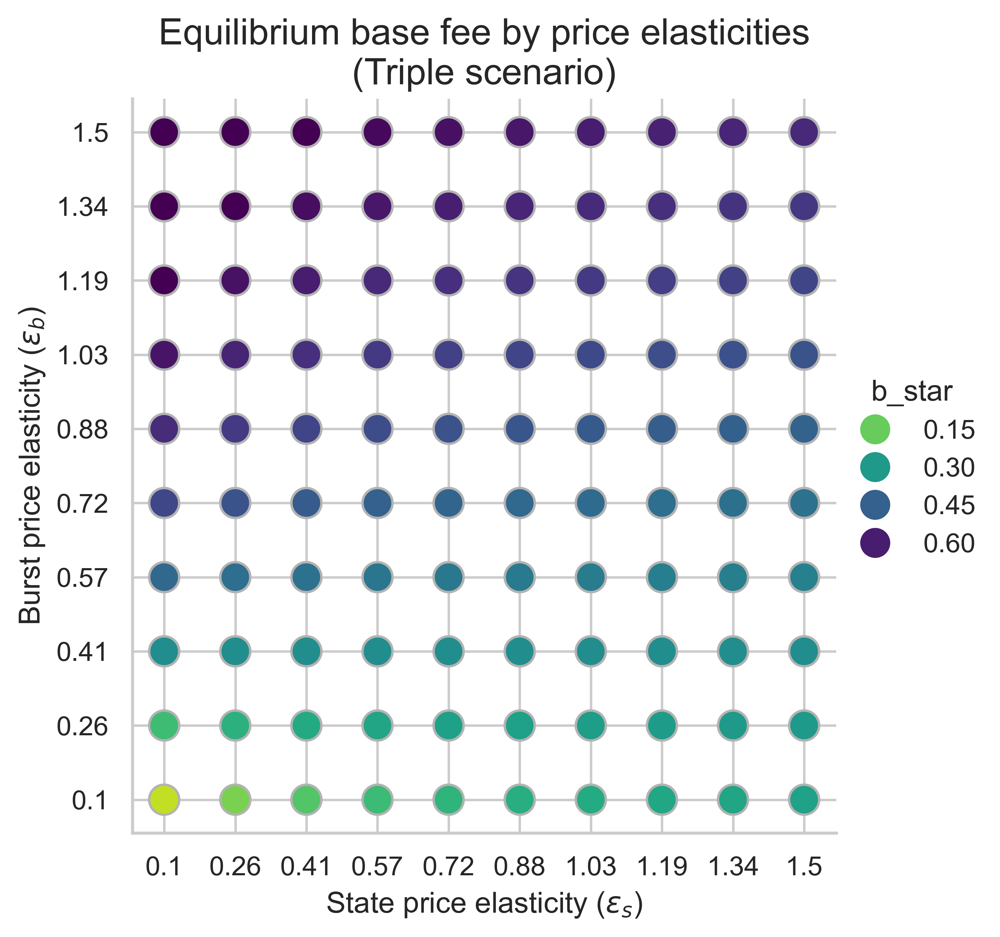

In [32]:
g = sns.relplot(
    data=triple_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="b_star",
    palette="viridis_r",
    hue_norm=(0, 0.65),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Equilibrium base fee by price elasticities\n(Triple scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
plt.show()

## Repricing impact for 10x gas limit & 10x state price

#### Parameters

- $n=10$
- $m=10$
- $G^0=36$ (in million gas units)
- $b^0=1$ (in gwei)
- State growth is 205 MiB per day $\implies$ $S^0 = \frac{205 \cdot 1048576 \cdot 12}{60 \cdot 60 \cdot 24}$ bytes
- $\varepsilon_s,\varepsilon_b  \in [0.1, 1.5]$



In [33]:
n=10
m=10
G_0=36
b_0=1.0
S_0 = (205 * 1048576 * 12)/(60 * 60 * 24)
results_list = []

for eps_s in np.linspace(0.1, 1.5, 10):
    for eps_b in np.linspace(0.1, 1.5, 10):
        # Find equilibrium
        b_star = find_equilibrium_base_fee(m, eps_s, eps_b, b_0)
        # Compute usage and shares
        results = compute_equilibrium_stats(b_star, m, n, eps_s, eps_b, G_0, b_0, S_0)
        results["eps_s"] = eps_s.round(2).astype(str)
        results["eps_b"] = eps_b.round(2).astype(str)
        results_list.append(results)

ten_times_scenario_df = pd.DataFrame(results_list)

### Results

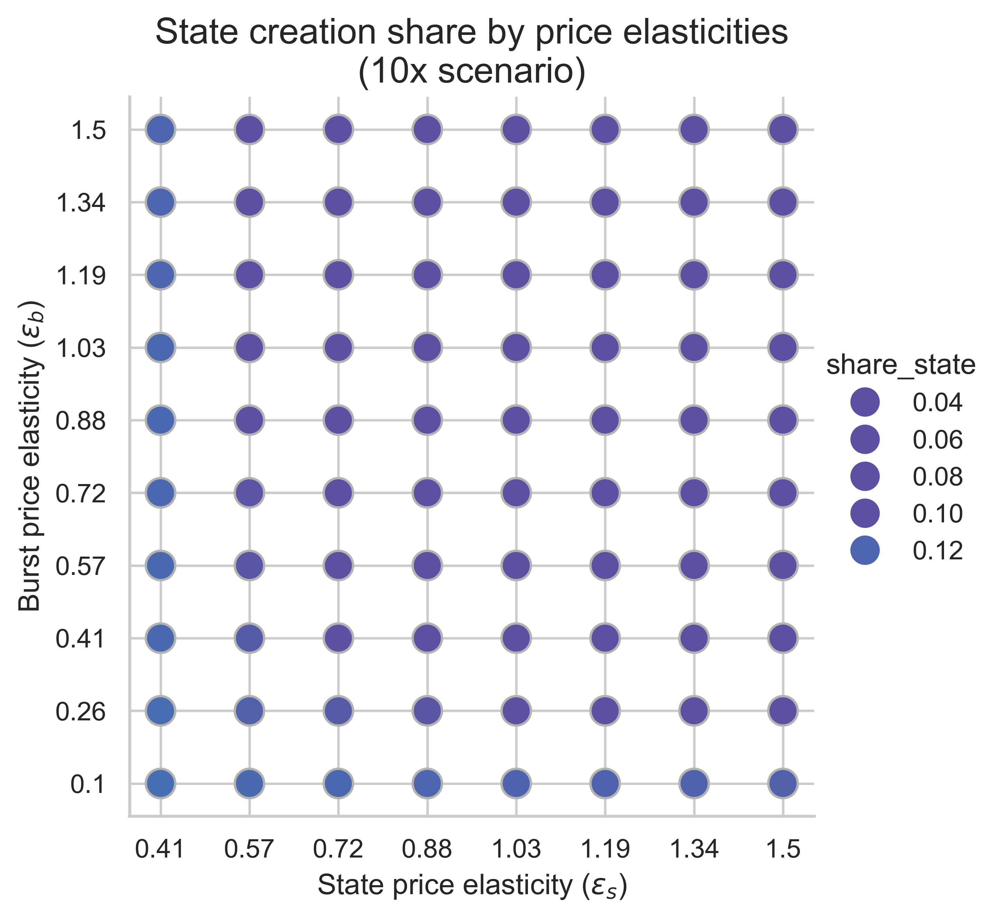

In [34]:
g = sns.relplot(
    data=ten_times_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="share_state",
    palette="Spectral_r",
    hue_norm=(0.1, 0.6),
    edgecolor=".7",
    s=150,
)
g.set(
    title="State creation share by price elasticities\n(10x scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
plt.show()

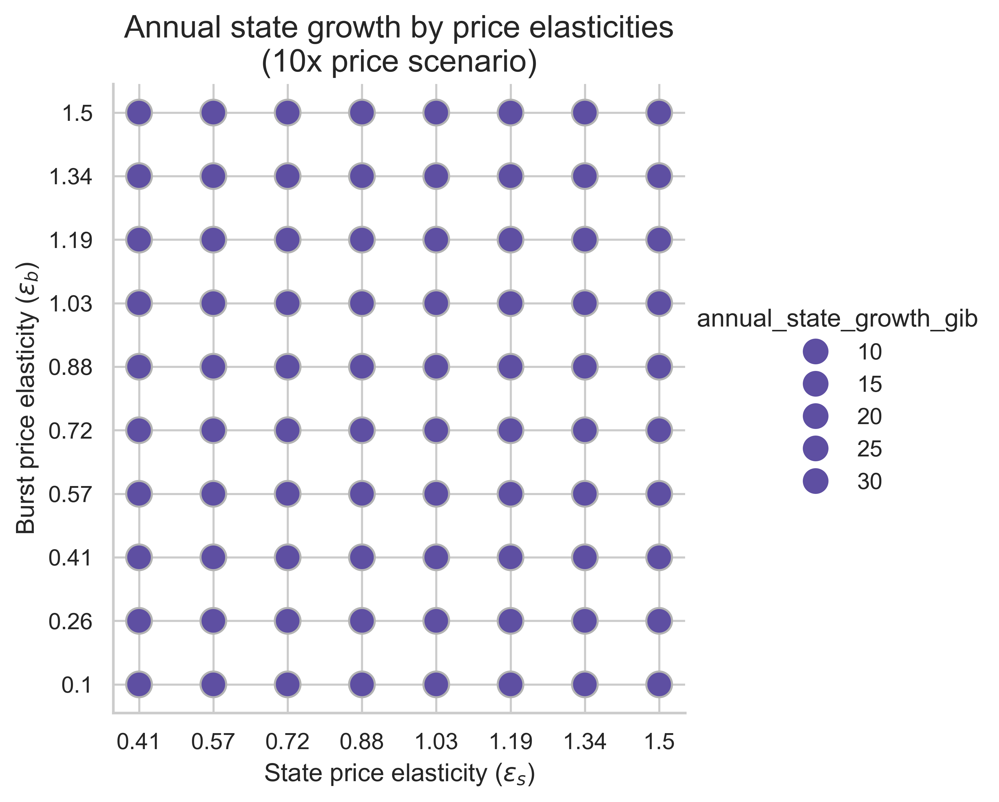

In [35]:
g = sns.relplot(
    data=ten_times_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="annual_state_growth_gib",
    palette="Spectral_r",
    hue_norm=(50, 300),
    edgecolor=".7",
    s=150,
)
g.set(
    title="Annual state growth by price elasticities\n(10x price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
plt.show()

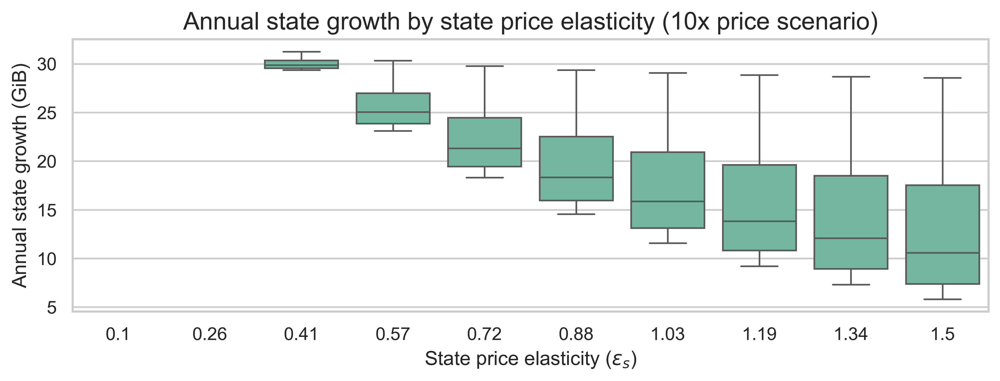

In [36]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=ten_times_scenario_df,
    x="eps_s",
    y="annual_state_growth_gib"
)

plt.title("Annual state growth by state price elasticity (10x price scenario)")
plt.ylabel("Annual state growth (GiB)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
plt.show()

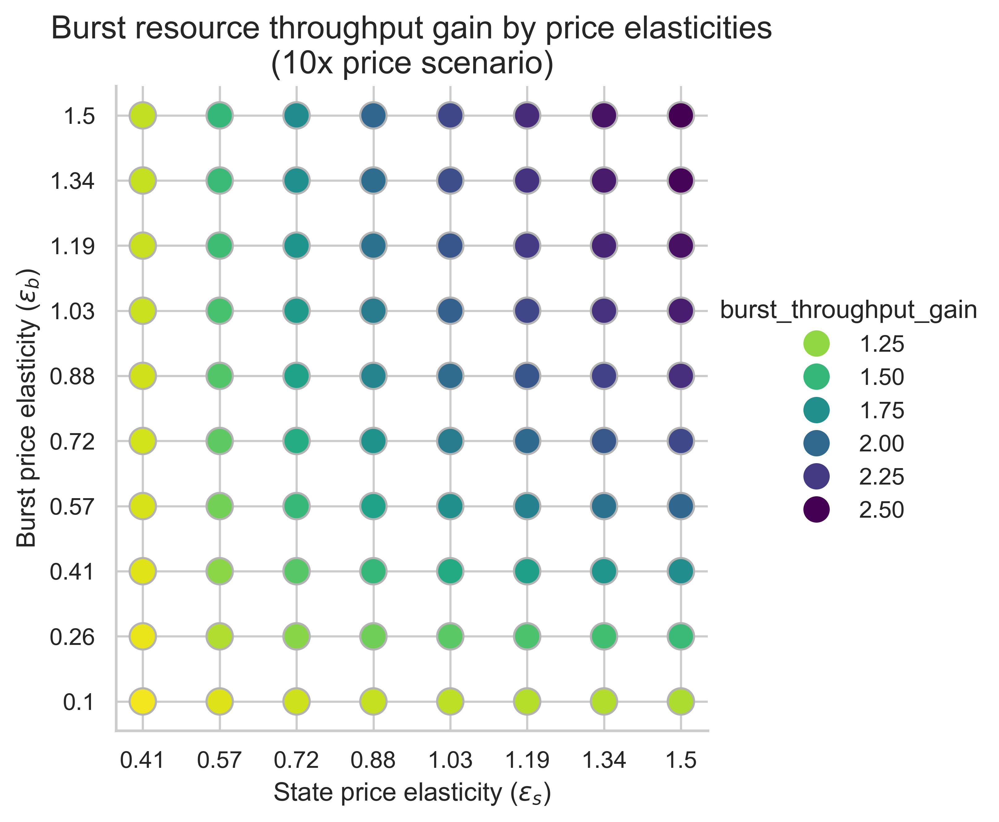

In [37]:
ten_times_scenario_df["burst_throughput_gain"] = ten_times_scenario_df["burst_throughput_s"]/0.7
g = sns.relplot(
    data=ten_times_scenario_df,
    x="eps_s",
    y="eps_b",
    hue="burst_throughput_gain",
    palette="viridis_r",
    edgecolor=".7",
    s=150,
    hue_norm=(1, 2.5),
)
g.set(
    title="Burst resource throughput gain by price elasticities\n(10x price scenario)",
    xlabel=r"State price elasticity ($\varepsilon_s$)",
    ylabel=r"Burst price elasticity ($\varepsilon_b$)",
)
g.ax.invert_yaxis()
plt.show()

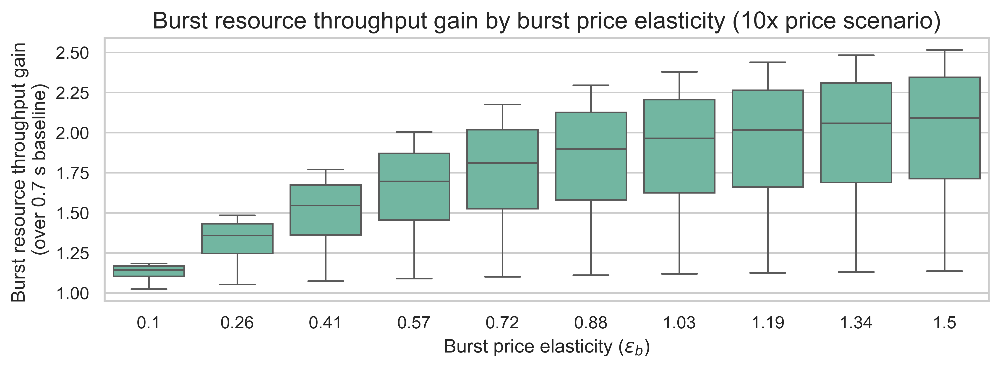

In [38]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=ten_times_scenario_df,
    x="eps_b",
    y="burst_throughput_gain"
)

plt.title("Burst resource throughput gain by burst price elasticity (10x price scenario)")
plt.ylabel("Burst resource throughput gain \n(over 0.7 s baseline)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
plt.show()

## Additional plots

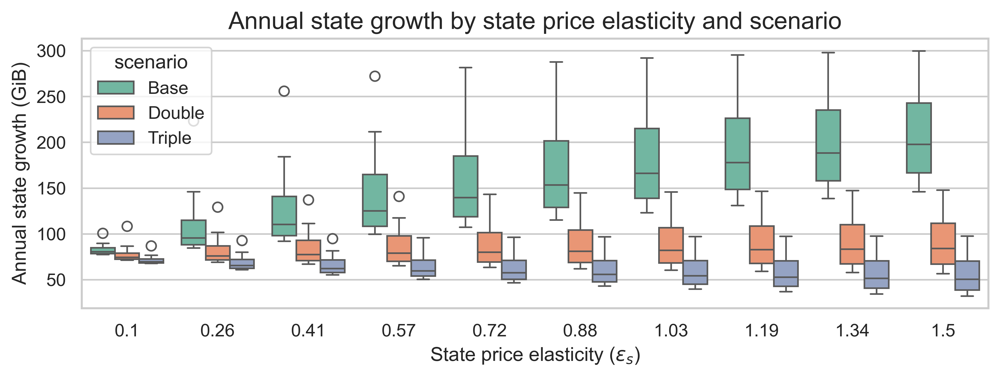

In [39]:
base_scenario_df["scenario"] = "Base"
double_scenario_df["scenario"] = "Double"
triple_scenario_df["scenario"] = "Triple"
scenario_df = pd.concat([base_scenario_df, double_scenario_df, triple_scenario_df], ignore_index=True)

plt.figure(figsize=(10, 3))
sns.boxplot(
    data=scenario_df,
    x="eps_s",
    y="annual_state_growth_gib",
    hue="scenario"
)

plt.title("Annual state growth by state price elasticity and scenario")
plt.ylabel("Annual state growth (GiB)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
our_file = os.path.join(our_dir, "state_growth_all.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

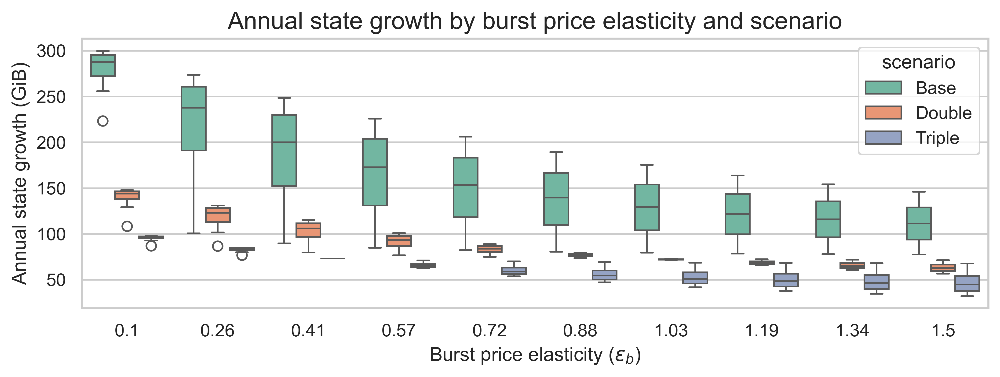

In [40]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=scenario_df,
    x="eps_b",
    y="annual_state_growth_gib",
    hue="scenario"
)

plt.title("Annual state growth by burst price elasticity and scenario")
plt.ylabel("Annual state growth (GiB)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
plt.show()

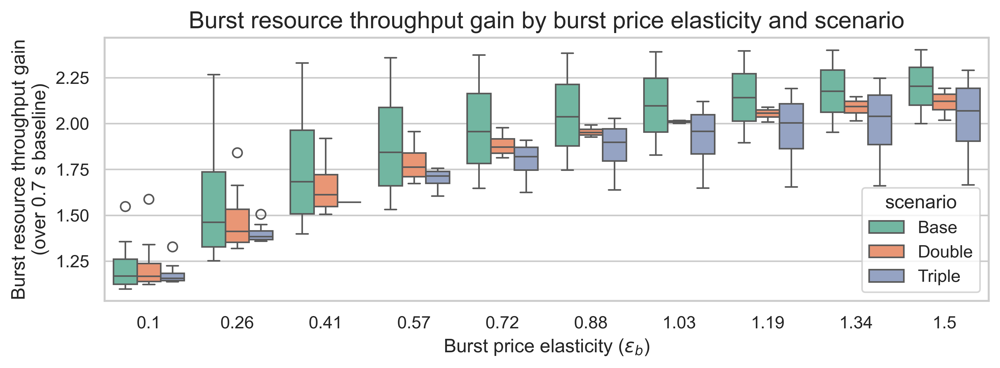

In [41]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=scenario_df,
    x="eps_b",
    y="burst_throughput_gain",
    hue="scenario"
)

plt.title("Burst resource throughput gain by burst price elasticity and scenario")
plt.ylabel("Burst resource throughput gain\n(over 0.7 s baseline)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
our_file = os.path.join(our_dir, "burst_throughput_all.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()

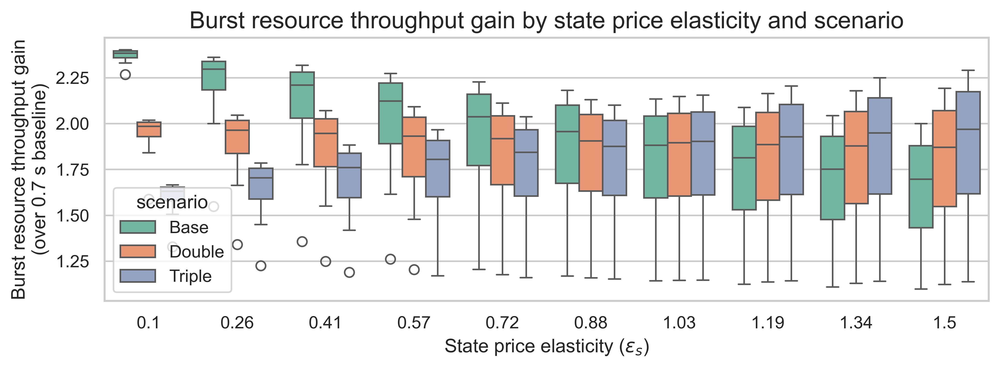

In [42]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=scenario_df,
    x="eps_s",
    y="burst_throughput_gain",
    hue="scenario"
)

plt.title("Burst resource throughput gain by state price elasticity and scenario")
plt.ylabel("Burst resource throughput gain\n(over 0.7 s baseline)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
plt.show()

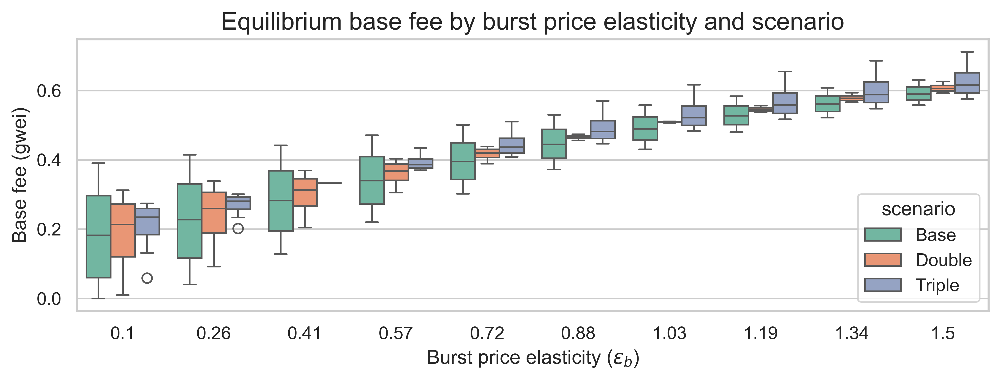

In [48]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=scenario_df,
    x="eps_b",
    y="b_star",
    hue="scenario"
)

plt.title("Equilibrium base fee by burst price elasticity and scenario")
plt.ylabel("Base fee (gwei)")
plt.xlabel(r"Burst price elasticity ($\varepsilon_b$)")
our_file = os.path.join(our_dir, "base_fee_burst.png",)
plt.savefig(our_file, bbox_inches='tight')
plt.show()

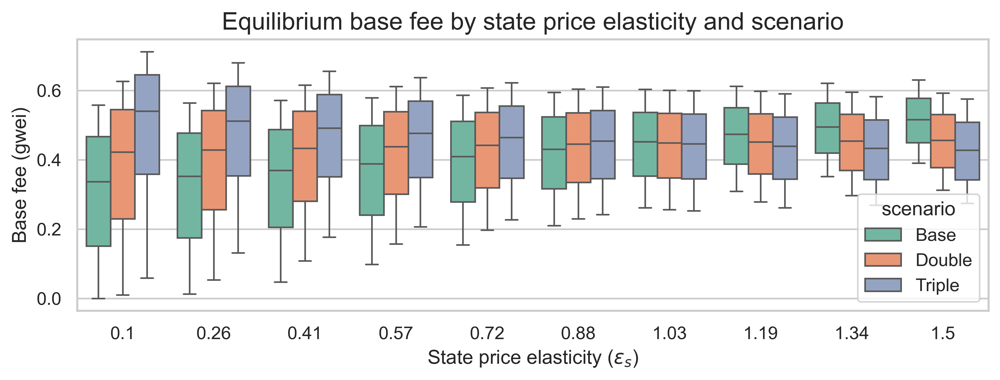

In [54]:
plt.figure(figsize=(10, 3))
sns.boxplot(
    data=scenario_df,
    x="eps_s",
    y="b_star",
    hue="scenario"
)

plt.title("Equilibrium base fee by state price elasticity and scenario")
plt.ylabel("Base fee (gwei)")
plt.xlabel(r"State price elasticity ($\varepsilon_s$)")
our_file = os.path.join(our_dir, "base_fee_state.png",)
plt.savefig(our_file, bbox_inches='tight')
plt.show()

## Equilibrium visualization

In [52]:
# Parameters
G0 = 1.0          # Normalize the original gas limit G^0 to 1
b0 = 1.0          # Normalize the original base fee b^0 to 1
eps_s = 0.6       # State demand elasticity
eps_b = 1.0       # Burst demand elasticity
n = 2.0           # double gas limit
m = 1.0           # no state reprice

# Demand (in gas units) as function of base fee
def state_demand(b, m=m):
    x = b / b0
    return 0.15 * G0 * (m ** (1.0 - eps_s)) * (x ** (-eps_s))

def burst_demand(b):
    x = b / b0
    return 0.35 * G0 * (x ** (-eps_b))

def total_demand(b, m=m):
    return state_demand(b, m) + burst_demand(b)

# Compute metrics
target_usage = 0.5 * n * G0
b_star = find_equilibrium_base_fee(m, eps_s, eps_b, b_0)
print("Equilibrium b* =", b_star, " (b*/b0 =", b_star / b0, ")")
print("Q_total(b*, m) =", total_demand(b_star, m), " (target =", target_usage, ")")

Equilibrium b* = 0.45994447831093443  (b*/b0 = 0.45994447831093443 )
Q_total(b*, m) = 0.9999999999794492  (target = 1.0 )


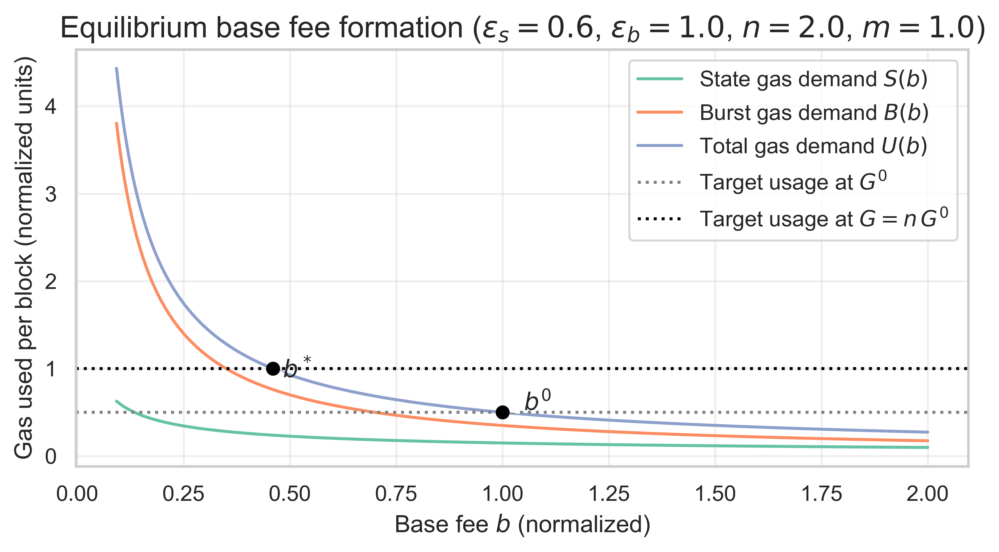

In [53]:
# Build grid for plotting
b_min_plot = min(b_star, b0) * 0.2
b_max_plot = max(b_star, b0) * 2.0
b_grid = np.linspace(b_min_plot, b_max_plot, 400)
Q_s_grid = state_demand(b_grid, m=m)
Q_b_grid = burst_demand(b_grid)
Q_tot_grid = Q_s_grid + Q_b_grid

plt.figure(figsize=(7, 4))
# Demand curves (in gas units per block) vs base fee
plt.plot(b_grid, Q_s_grid, label="State gas demand $S(b)$")
plt.plot(b_grid, Q_b_grid, label="Burst gas demand $B(b)$")
plt.plot(b_grid, Q_tot_grid, label="Total gas demand $U(b)$")
# Gas limit (target usage) lines
plt.axhline(0.5 * G0, linestyle=":", label=r"Target usage at $G^0$", c="grey")
plt.axhline(0.5 * n * G0, linestyle=":", label=rf"Target usage at $G=n\,G^0$", c="black")
# Equilibrium points and vertical lines for b0, b*
plt.scatter([b0], [0.5 * G0], color="black", zorder=5)
plt.scatter([b_star], [0.5 * n * G0], color="black", zorder=5)
# Annotate the change from b0 to b*
plt.annotate(
    r"$b^0$",
    xy=(b0, 0.5 * G0),
    xytext=(b0 * 1.05, 0.5 * G0 * 1.05),
    arrowprops=dict(arrowstyle="->", linewidth=1),
)
plt.annotate(
    r"$b^*$",
    xy=(b_star, 0.5 * n * G0),
    xytext=(b_star * 1.05, 0.5 * n * G0 * 0.9),
    arrowprops=dict(arrowstyle="->", linewidth=1),
)
# Final cosmetics
plt.xlabel("Base fee $b$ (normalized)")
plt.ylabel("Gas used per block (normalized units)")
plt.title(
    rf"Equilibrium base fee formation ($\varepsilon_s={eps_s}$, "
    rf"$\varepsilon_b={eps_b}$, $n={n}$, $m={m}$)"
)
plt.legend(loc="upper right")
plt.grid(True, alpha=0.3)
plt.tight_layout()
our_file = os.path.join(our_dir, "base_fee_equilibrium.png")
plt.savefig(our_file, bbox_inches='tight')
plt.show()